# Latent Space Interpolation

## Setup

 - Select runtime with Python 2 and GPU
 - Mount Drive to get data if you wish

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
!git clone https://github.com/pavanchhatpar/AttnGAN.git

Cloning into 'AttnGAN'...
remote: Enumerating objects: 30, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 321 (delta 13), reused 17 (delta 7), pack-reused 291
Receiving objects: 100% (321/321), 36.77 MiB | 9.07 MiB/s, done.
Resolving deltas: 100% (180/180), done.


In [0]:
import os
os.chdir("./AttnGAN")

In [233]:
!git pull origin master

remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/pavanchhatpar/AttnGAN
 * branch            master     -> FETCH_HEAD
   e7806cd..d43bb6e  master     -> origin/master
Updating e7806cd..d43bb6e
Fast-forward
 code/main.py | 4 +++-
 1 file changed, 3 insertions(+), 1 deletion(-)


In [3]:
!sh setup.sh

setup.sh: 1: setup.sh: .env: not found
Make a file  and add content in it as shown in the sample below

export BIRDSMETA="./drive/My Drive/Spring 20/Spec. AI/birds.zip"
export DAMSMBIRD="./drive/My Drive/Spring 20/Spec. AI/bird.zip"
export GANBIRD="./drive/My Drive/Spring 20/Spec. AI/bird_AttnGAN2.pth"

import it using dotenv


In [4]:
!echo 'export BIRDSMETA="../drive/My Drive/Spring 20/Spec. AI/birds.zip"' > .env
!echo 'export DAMSMBIRD="../drive/My Drive/Spring 20/Spec. AI/bird.zip"' >> .env
!echo 'export GANBIRD="../drive/My Drive/Spring 20/Spec. AI/bird_AttnGAN2.pth"' >> .env
!cat .env

export BIRDSMETA="../drive/My Drive/Spring 20/Spec. AI/birds.zip"
export DAMSMBIRD="../drive/My Drive/Spring 20/Spec. AI/bird.zip"
export GANBIRD="../drive/My Drive/Spring 20/Spec. AI/bird_AttnGAN2.pth"


In [5]:
from dotenv import load_dotenv

load_dotenv()

True

In [8]:
!sh setup.sh

Streaming output truncated to the last 5000 lines.
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0004_111989.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0127_111935.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0094_112773.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0028_113217.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0126_110959.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0007_111029.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0096_111519.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0120_113001.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0010_112678.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0025_111669.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0002_112905.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0014_112947.j

## Utils

In [0]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_caption(caption_number, gan_number=2, n = 6):
  fig, axes = plt.subplots(nrows=1, ncols=n, figsize=(30,20))
  fig.tight_layout()
  for z in range(n):
    fname = '../models/bird_AttnGAN2/example_captions/0_s_%d_g%d_z%d.png' % (caption_number, gan_number, z)
    img = mpimg.imread(fname)
    axes[z].imshow(img)

def show_attn(caption_number, n=10):
  fig, axes = plt.subplots(nrows=n*2, ncols=1, figsize=(50,10*n))
  for z in range(n):
    for a in range(2):
      fname = '../models/bird_AttnGAN2/example_captions/0_s_%d_a%d_z%d.png' % (caption_number, a, z)
      img = mpimg.imread(fname)
      axes[z*2+a].imshow(img)

## Experiments

In [0]:
import os
os.chdir('code')

In [0]:
!mv ../data/birds/example_captions.txt ../data/birds/example_captions.default.txt

In [0]:
!rm -rf ../models/bird_AttnGAN2/example_captions/

### GAN generalization principles
 - Latent Space Interpolation
 - Linear arithmetic

In [0]:
!echo "a red bird with white belly" > ../data/birds/example_captions.txt
!echo "a black bird with white belly" >> ../data/birds/example_captions.txt
!echo "a blue bird with green belly" >> ../data/birds/example_captions.txt

In [268]:
!python main.py --cfg cfg/eval_bird.yml --gpu 0 --exp=lsi

Using config:
{'B_VALIDATION': False,
 'CONFIG_NAME': 'attn2',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 32,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 25},
 'TRAIN': {'BATCH_SIZE': 100,
           'B_NET_D': False,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.0002,
           'FLAG': False,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 600,
           'NET_E': '../DAMSMencoders/bird/text_encoder200.pth',
           'NET_G': '../models/bird_AttnGAN2.pth',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 5.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 2000},
 'TREE': {'BASE_

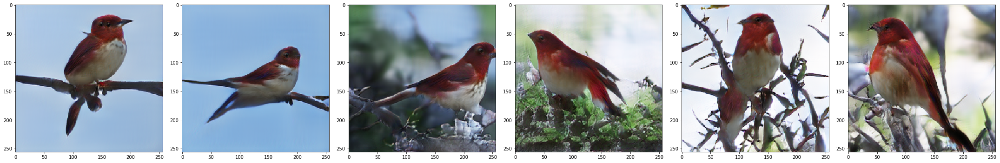

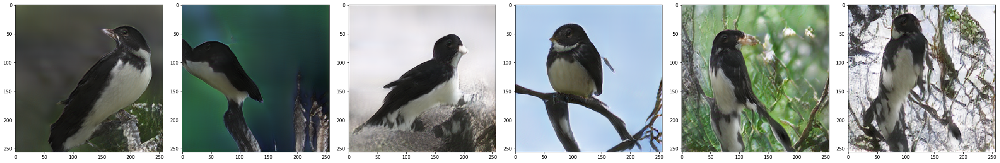

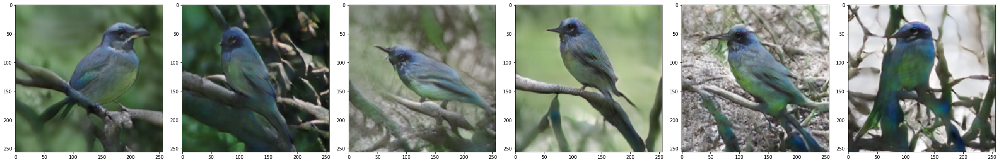

In [269]:
show_caption(0)
show_caption(1)
show_caption(2)

### Playing with words

#### Two colored bird without any more information
 - With lighter shade first, deformations tend to occur more often
 - Lighter shade tends to stick to the belly

In [0]:
!echo "red and black bird" > ../data/birds/example_captions.txt
!echo "black and red bird" >> ../data/birds/example_captions.txt
!echo "blue and yellow bird" >> ../data/birds/example_captions.txt
!echo "yellow and blue bird" >> ../data/birds/example_captions.txt

In [147]:
!python main.py --cfg cfg/eval_bird.yml --gpu 0 --exp=color

Using config:
{'B_VALIDATION': False,
 'CONFIG_NAME': 'attn2',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 32,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 25},
 'TRAIN': {'BATCH_SIZE': 100,
           'B_NET_D': False,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.0002,
           'FLAG': False,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 600,
           'NET_E': '../DAMSMencoders/bird/text_encoder200.pth',
           'NET_G': '../models/bird_AttnGAN2.pth',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 5.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 2000},
 'TREE': {'BASE_

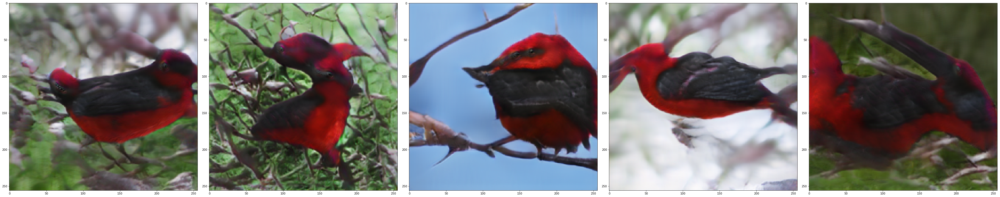

In [148]:
show_caption(0, n=5)

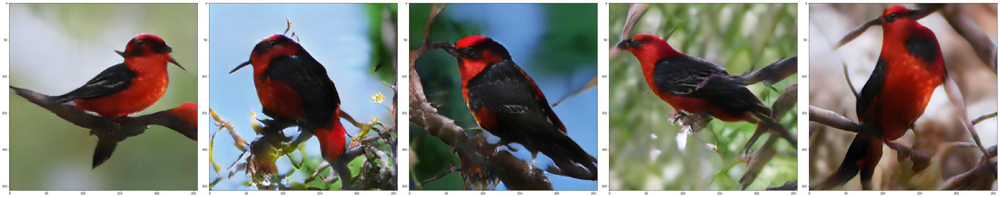

In [149]:
show_caption(1, n=5)

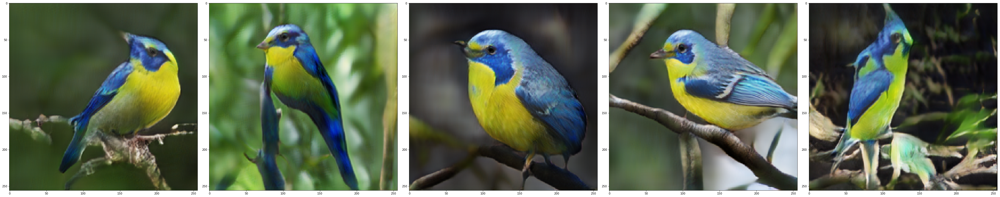

In [150]:
show_caption(2, n=5)

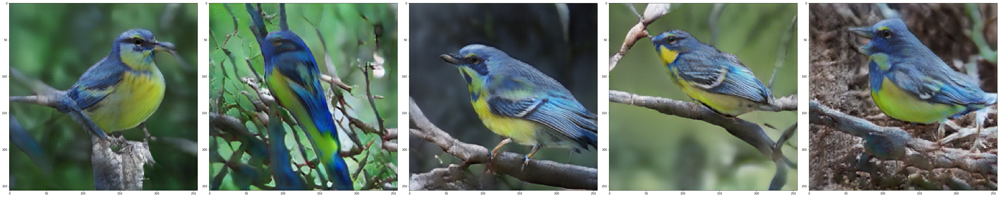

In [151]:
show_caption(3, n=5)

#### Adjective distance from body part

In [0]:
!echo "this bird has a green crown and black belly" > ../data/birds/example_captions.txt
!echo "this bird has a green crown, its belly color is black" >> ../data/birds/example_captions.txt

In [199]:
!python main.py --cfg cfg/eval_bird.yml --gpu 0 --exp=color

Using config:
{'B_VALIDATION': False,
 'CONFIG_NAME': 'attn2',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 32,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 25},
 'TRAIN': {'BATCH_SIZE': 100,
           'B_NET_D': False,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.0002,
           'FLAG': False,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 600,
           'NET_E': '../DAMSMencoders/bird/text_encoder200.pth',
           'NET_G': '../models/bird_AttnGAN2.pth',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 5.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 2000},
 'TREE': {'BASE_

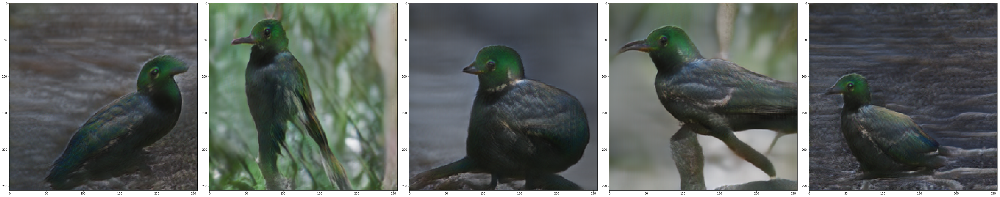

In [200]:
show_caption(0, n=5)

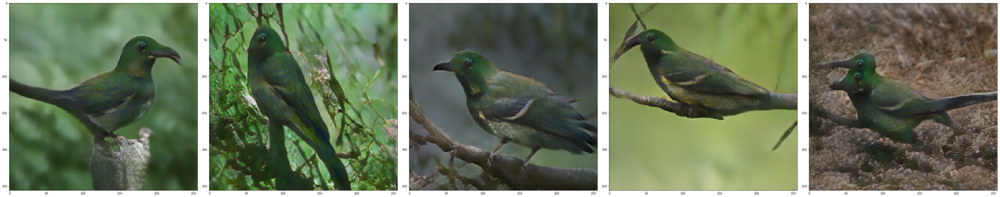

In [201]:
show_caption(1, n=5)

#### Swimming birds

In [0]:
!echo "swimming duck" > ../data/birds/example_captions.txt
!echo "swimming bird" >> ../data/birds/example_captions.txt

In [274]:
!python main.py --cfg cfg/eval_bird.yml --gpu 0 --exp=color

Using config:
{'B_VALIDATION': False,
 'CONFIG_NAME': 'attn2',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 32,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 25},
 'TRAIN': {'BATCH_SIZE': 100,
           'B_NET_D': False,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.0002,
           'FLAG': False,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 600,
           'NET_E': '../DAMSMencoders/bird/text_encoder200.pth',
           'NET_G': '../models/bird_AttnGAN2.pth',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 5.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 2000},
 'TREE': {'BASE_

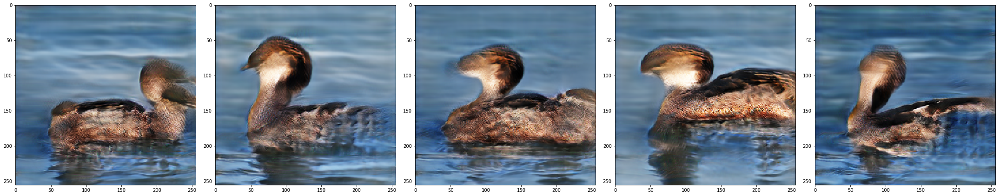

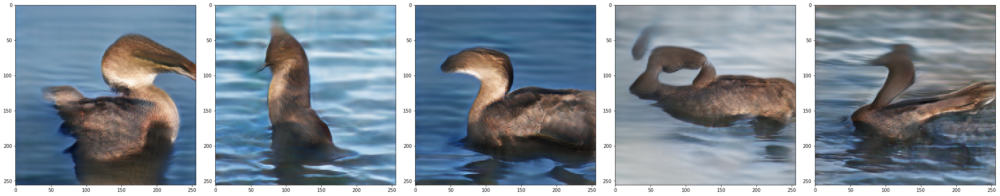

In [275]:
show_caption(0, n=5)
show_caption(1, n=5)

### Role of latent vector

#### The latent vector gives variance in bird's structure but not colors when unspecified


In [0]:
!echo "this bird has red wings and has a yellow belly" > ../data/birds/example_captions.txt
!echo "this bird has a yellow belly" >> ../data/birds/example_captions.txt
!echo "this bird has a white belly" >> ../data/birds/example_captions.txt

In [287]:
!python main.py --cfg cfg/eval_bird.yml --gpu 0 --exp=color

Using config:
{'B_VALIDATION': False,
 'CONFIG_NAME': 'attn2',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 32,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 25},
 'TRAIN': {'BATCH_SIZE': 100,
           'B_NET_D': False,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.0002,
           'FLAG': False,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 600,
           'NET_E': '../DAMSMencoders/bird/text_encoder200.pth',
           'NET_G': '../models/bird_AttnGAN2.pth',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 5.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 2000},
 'TREE': {'BASE_

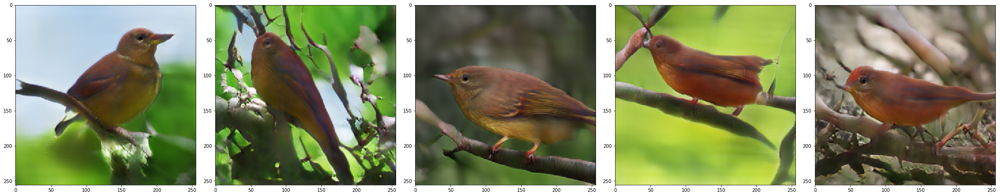

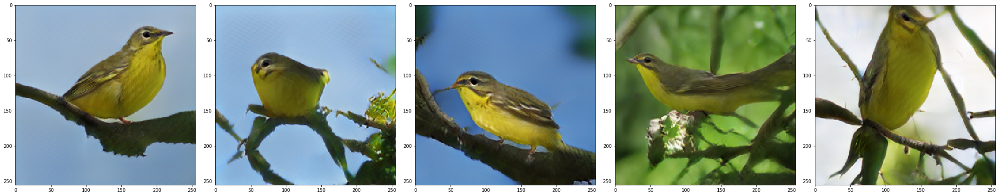

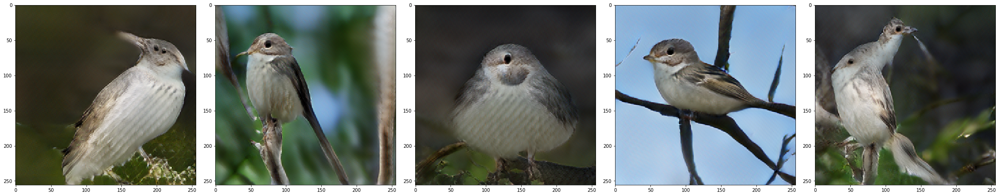

In [288]:
show_caption(0, n=5)
show_caption(1, n=5)
show_caption(2, n=5)

#### The default bird
 - Further shows how there is no variance in colors by default
 - On the other hand, beak lengths show some variance
 just with the latent vector being varied

In [0]:
!echo "this is a bird" > ../data/birds/example_captions.txt
!echo "bird" >> ../data/birds/example_captions.txt

In [206]:
!python main.py --cfg cfg/eval_bird.yml --gpu 0 --exp=color

Using config:
{'B_VALIDATION': False,
 'CONFIG_NAME': 'attn2',
 'CUDA': True,
 'DATASET_NAME': 'birds',
 'DATA_DIR': '../data/birds',
 'GAN': {'B_ATTENTION': True,
         'B_DCGAN': False,
         'CONDITION_DIM': 100,
         'DF_DIM': 64,
         'GF_DIM': 32,
         'R_NUM': 2,
         'Z_DIM': 100},
 'GPU_ID': 0,
 'RNN_TYPE': 'LSTM',
 'TEXT': {'CAPTIONS_PER_IMAGE': 10, 'EMBEDDING_DIM': 256, 'WORDS_NUM': 25},
 'TRAIN': {'BATCH_SIZE': 100,
           'B_NET_D': False,
           'DISCRIMINATOR_LR': 0.0002,
           'ENCODER_LR': 0.0002,
           'FLAG': False,
           'GENERATOR_LR': 0.0002,
           'MAX_EPOCH': 600,
           'NET_E': '../DAMSMencoders/bird/text_encoder200.pth',
           'NET_G': '../models/bird_AttnGAN2.pth',
           'RNN_GRAD_CLIP': 0.25,
           'SMOOTH': {'GAMMA1': 5.0,
                      'GAMMA2': 5.0,
                      'GAMMA3': 10.0,
                      'LAMBDA': 1.0},
           'SNAPSHOT_INTERVAL': 2000},
 'TREE': {'BASE_

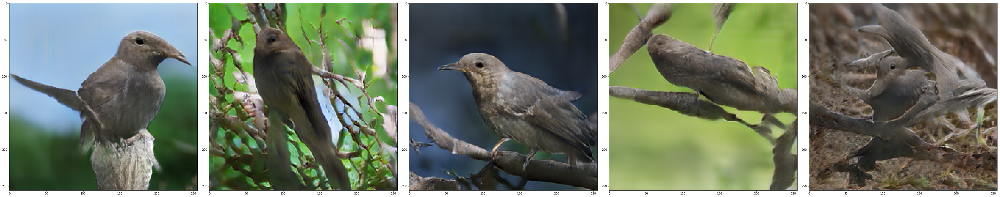

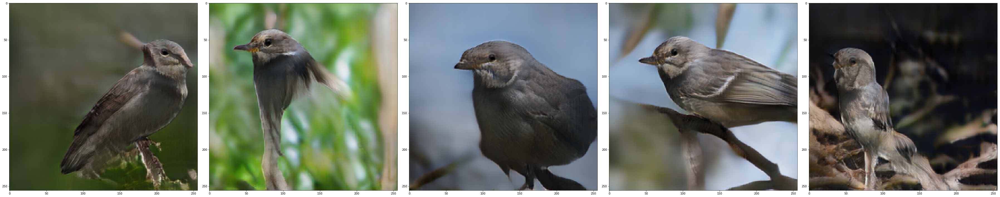

In [212]:
show_caption(0, n=5)
show_caption(1, n=5)